<a href="https://colab.research.google.com/github/lanyu0322/phd_semester1/blob/master/4_population_fit_constraint.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import os
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from shapely.geometry import Point

from scipy.optimize import leastsq
import statistics
# -- install geopandas
!pip install geopandas
!pip install gmaps

     |████████████████████████████████| 931kB 2.8MB/s 
     |████████████████████████████████| 14.7MB 309kB/s 
     |████████████████████████████████| 10.4MB 54.0MB/s 
     |████████████████████████████████| 1.1MB 2.8MB/s 
  Created wheel for gmaps: filename=gmaps-0.9.0-py2.py3-none-any.whl size=2076096 sha256=50e479922bcb3f5e6fd05c960f64436c34e7a708823a959efec6fc9ed8848099
  Stored in directory: /root/.cache/pip/wheels/33/eb/41/5302168c36fc8ce8f48143bb58fde1015d5bc0c62bc3ddbb38
Successfully built gmaps


In [0]:
# -- read in the counts
camera_fname = os.path.join("drive", "My Drive", "lwir", "data", "nycdot", "cams_ft_wd.feather")
camera = pd.read_feather(camera_fname)
fname = os.path.join("drive", "My Drive", "lwir", "data", "nycdot", "avg_weekend_ts.feather")
weekend = pd.read_feather(fname)
# -- extract just the counts
camarr = camera.drop(columns=["cam_id", "lat", "lon"]).values

# fit 4-pop model

In [4]:
# -- define gaussian
def gauss(xarr, x0, sig, scl):
  """ Create a 1D Gaussian """
  
  amp = scl / (sig * np.sqrt(2.0 * np.pi))
#   amp = scl
  val = -0.5 * ((xarr - x0) / sig)**2
  
  return amp * np.exp(val)

# -- define model error
def res(param, xval, yval):
  m1, m2, m3, sd1, sd2, sd3, scl1, scl2, scl3, wamp, off = param
  model = gauss(xval, m1, sd1, scl1) + gauss(xval, m2, sd2, scl2) + \
            gauss(xval, m3, sd3, scl3) + wamp * wendvals + off
  return yval - model


# -- set inital guess
avgs  = [35, 47, 70] 
sigs  = [3, 3, 3]
scls  = [5, 5, 5]
off   = [0.5]
wamp = [6]
param = avgs + sigs + scls + wamp + off
print(param)

[35, 47, 70, 3, 3, 3, 5, 5, 5, 6, 0.5]


In [0]:
#4-population fit by 157 cameras

from scipy.optimize import least_squares
camarr = pd.DataFrame(camarr)

# -- run the optimization (i.e., model fitting)
wendvals = weekend["avg_counts"].values
xval_final = np.arange(96)
plsq = [] 
       
for i in range(len(camarr)):
  plsq.append(least_squares(res, param, bounds=([24., 44., 64., 2.0, 2.0, 2.0, 0, 0, 0, 0, -np.inf], [44., 64., 80., 8., 8., 8., np.inf, np.inf, np.inf, np.inf, np.inf]), args=(xval_final, camarr.iloc[i])))

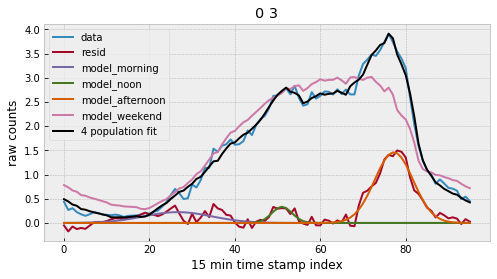

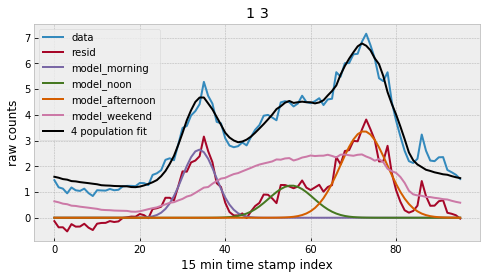

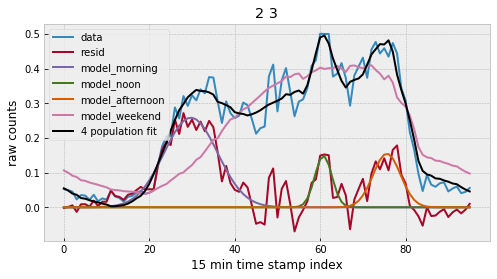

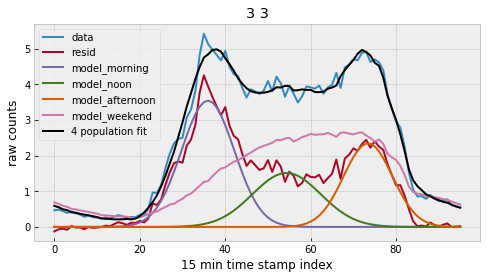

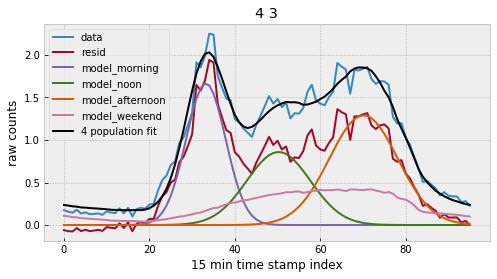

...

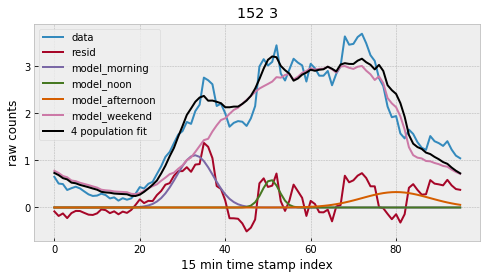

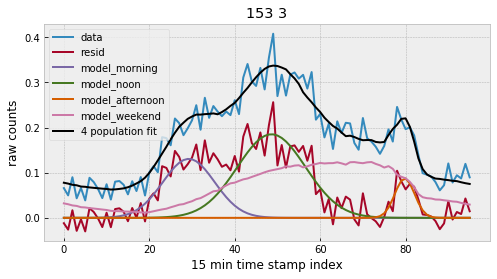

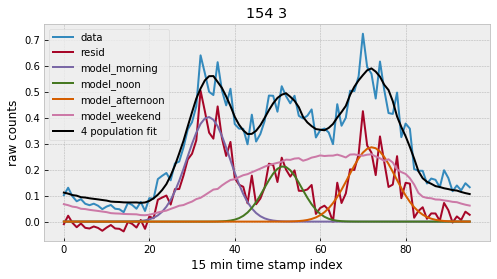

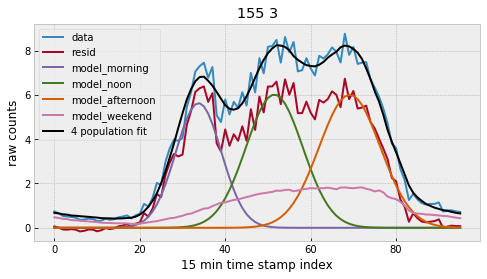

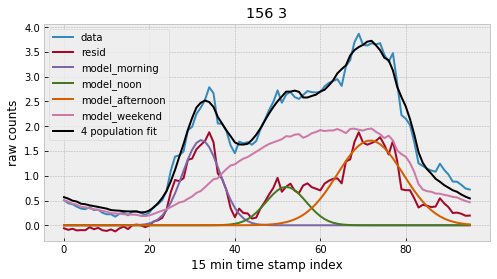

In [6]:
#plot model 
for i in range(len(plsq)):
  m1, m2, m3, sd1, sd2, sd3, scl1, scl2, scl3, wamp, off = plsq[i]["x"]
  model1 = gauss(xval_final, m1, sd1, scl1)
  model2 = gauss(xval_final, m2, sd2, scl2)
  model3 = gauss(xval_final, m3, sd3, scl3)
  pdat = camarr.iloc[i].values
  resid = pdat - wamp * wendvals - off
  model4 = wamp * wendvals
  model5 = camarr.iloc[i] - wamp * wendvals
  off = off
  plt.style.use("bmh")
  fig, ax = plt.subplots(figsize=[8, 4])
  ax.plot(xval_final, camarr.iloc[i], label="data")

  ax.plot(resid, label="resid")
  ax.plot(model1, label="model_morning")
  ax.plot(model2, label="model_noon")
  ax.plot(model3, label="model_afternoon")
  ax.plot(wamp * wendvals, label="model_weekend")
  ax.plot(model1 + model2 + model3 + wamp * wendvals + off, "k", label="4 population fit")


  ax.set_title(str(camarr.index[i]) + " " + str(pd.to_datetime(camarr.index[i]).dayofweek))
  plt.xlabel("15 min time stamp index")
  plt.ylabel("raw counts")
  plt.legend()
  plt.show()

In [0]:
parr = pd.DataFrame(plsq)
parr_avg = pd.DataFrame(np.vstack(parr["x"]))
#parr_avg.columns = ["m1", "m2", "m3", "sd1", "sd2", "sd3", "scl1", "scl2", "scl3", "wamp", "off"]
parr_avg["sratio"] = parr_avg[7] / (0.5 * (parr_avg[6] + parr_avg[8]))
parr_avg.to_csv('4pop_para.csv', index=False)
!cp 4pop_para.csv "drive/My Drive/lwir/data/4_pop_fit"

# plot para

In [0]:
import matplotlib.pyplot as plt
import geopandas as gp

# -- sub-select Manhattan
bpath = os.path.join("drive", "My Drive", "lwir", "data", "boro_boundaries")
bname = "Borough Boundaries.geojson"
boros = gp.read_file(os.path.join(bpath, bname))
boros = boros[boros.boro_name == "Manhattan"]

# -- set the parks geometries file name
dpath = os.path.join("drive", "My Drive", "lwir", "data", "parks", "properties")
fname = "geo_export_5b605687-0f81-4fe4-9fb7-ec27cd43ab5f.shp"

# -- load the parks geometries and convert to NY State Plane
parks = gp.read_file(os.path.join(dpath, fname))
parks_m = parks[parks.borough == "M"]


Text(0.5, 1, 'sratio of 4 population fit')

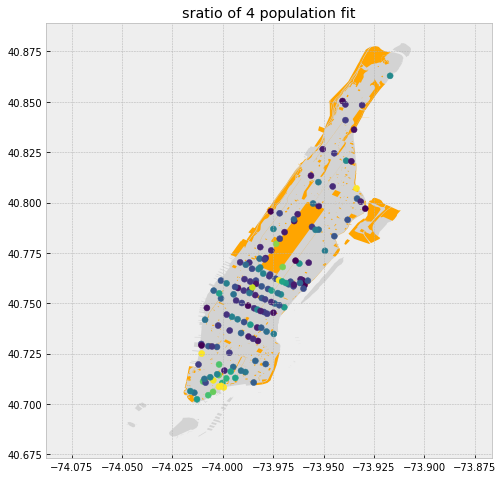

In [9]:
fig, ax = plt.subplots(figsize=[8, 8])
boros.plot(color="lightgrey", ax=ax, legend=True)
parks_m.plot(color="orange", ax=ax, legend=True)
ax.scatter(camera["lon"], camera["lat"], c=parr_avg["sratio"].clip(0, 2))
ax.axis("equal")
ax.set_title("sratio of 4 population fit")

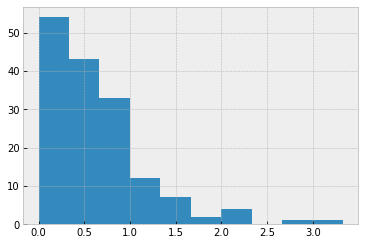

In [10]:
parr_avg["sratio"].hist()

Text(0.5, 1, 'wamp of 4 population fit')

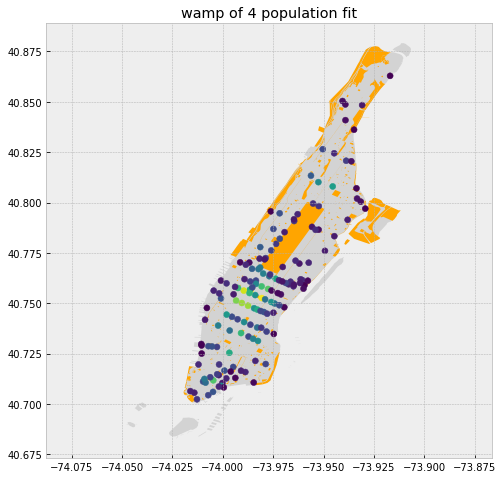

In [11]:
fig, ax = plt.subplots(figsize=[8, 8])
boros.plot(color="lightgrey", ax=ax, legend=True)
parks_m.plot(color="orange", ax=ax, legend=True)
ax.scatter(camera["lon"], camera["lat"], c=parr_avg[9])
ax.axis("equal")
ax.set_title("wamp of 4 population fit")

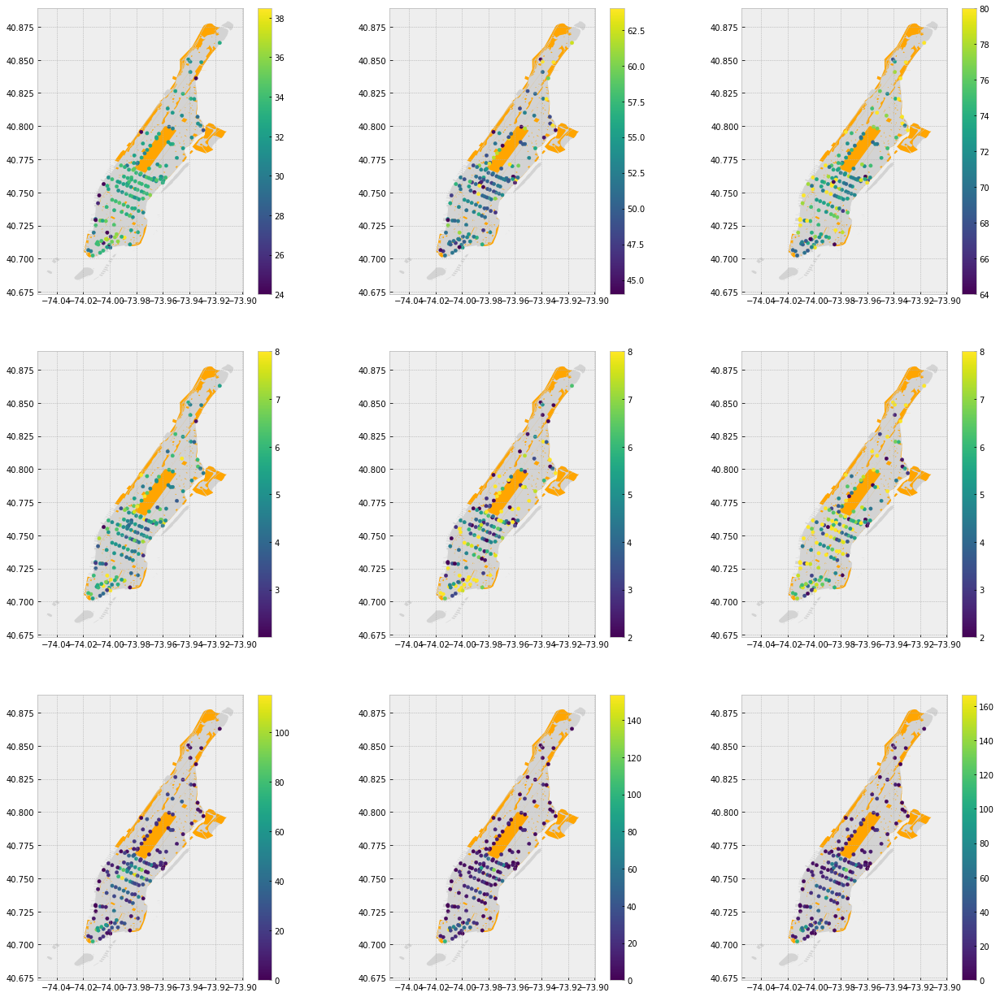

In [12]:
fig, axs = plt.subplots(3, 3, figsize=(22, 22))

for row in range(3):
  for col in range(3):
    i = 3 * row + col
    ax = axs[row, col]
    boros.plot(color="lightgrey", ax=ax)
    parks_m.plot(color="orange", ax=ax)
    sc = ax.scatter(camera["lon"], camera["lat"], s=18, c=parr_avg[i])
    fig.colorbar(mappable=sc, ax=ax)

   

# plot sratio

In [0]:
wname = "/content/drive/My Drive/lwir/data/4_pop_fit/wr_manhattan.csv"
wr_manhattan = pd.read_csv(wname)
f = parr_avg["sratio"]*(wr_manhattan["residents_manhattan"]/wr_manhattan["working_manhattan"] + 1)

(array([85., 44., 13.,  7.,  4.,  1.,  2.,  0.,  0.,  1.]),
 array([4.43183975e-27, 8.63834344e-01, 1.72766869e+00, 2.59150303e+00,
        3.45533738e+00, 4.31917172e+00, 5.18300607e+00, 6.04684041e+00,
        6.91067475e+00, 7.77450910e+00, 8.63834344e+00]),
 <a list of 10 Patch objects>)

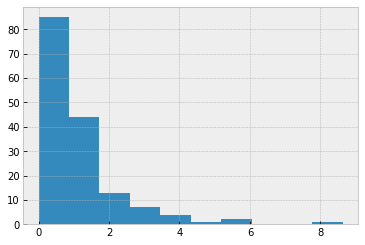

In [14]:
plt.hist(f, bins =10)

Text(0.5, 1.0, 'sratio*(r/w + 1)')

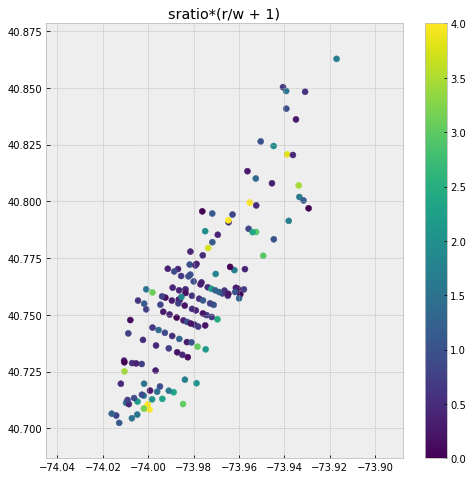

In [15]:
fig, ax = plt.subplots(figsize=[8, 8])
sct = ax.scatter(camera["lon"], camera["lat"], c=f.clip(0, 4))
ax.axis("equal")
fig.colorbar(sct)
fig.show()
ax.set_title("sratio*(r/w + 1)")


(array([128.,  15.,   6.,   3.,   0.,   0.,   0.,   4.,   0.,   1.]),
 array([1.37499949e-29, 1.09281106e-02, 2.18562212e-02, 3.27843318e-02,
        4.37124424e-02, 5.46405530e-02, 6.55686636e-02, 7.64967742e-02,
        8.74248848e-02, 9.83529954e-02, 1.09281106e-01]),
 <a list of 10 Patch objects>)

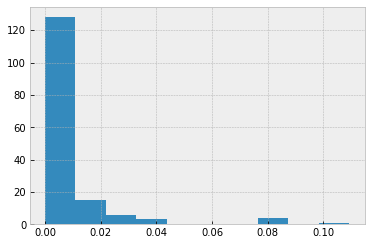

In [16]:
scl2_w = parr_avg[7] / wr_manhattan["working_manhattan"]
plt.hist(scl2_w)

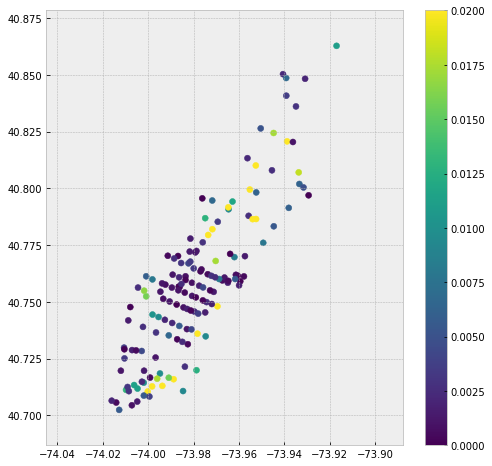

In [17]:
fig, ax = plt.subplots(figsize=[8, 8])
sct = ax.scatter(camera["lon"], camera["lat"], c=scl2_w.clip(0, 0.02))
ax.axis("equal")
fig.colorbar(sct)
fig.show()

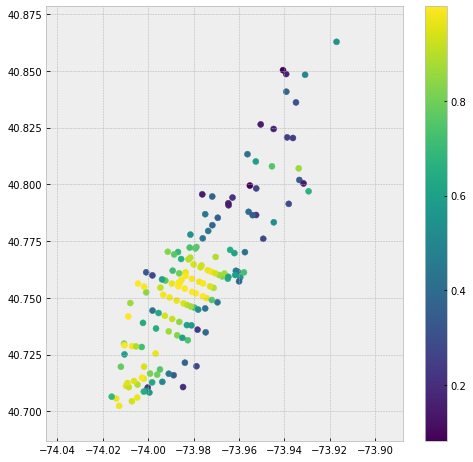

In [18]:
r = 1/(wr_manhattan["residents_manhattan"]/wr_manhattan["working_manhattan"] + 1)
fig, ax = plt.subplots(figsize=[8, 8])
sct = ax.scatter(camera["lon"], camera["lat"], c=r)
ax.axis("equal")
fig.colorbar(sct)
fig.show()

# avg_no_park and avg_park 4 pop fit

In [0]:
npname = "/content/drive/My Drive/lwir/data/4_pop_fit/avg_nopark.csv"
apname = "/content/drive/My Drive/lwir/data/4_pop_fit/avg_park.csv"
avg_nopark = pd.read_csv(npname).T
avg_park = pd.read_csv(apname).T

In [0]:
xval_final = np.arange(96)
para_nopark = []  
para_park = []  
                     #24, #middle:11am to 2 pm, 44, 64 upper:8pm,80

para_nopark.append(least_squares(res, param, bounds=([24., 44., 64., 2.0, 2.0, 2.0, 0, 0, 0, 0, -np.inf], [44., 64., 80., 8., 8., 8., np.inf, np.inf, np.inf, np.inf, np.inf]), args=(xval_final, avg_nopark.iloc[0])))
para_park.append(least_squares(res, param, bounds=([24., 44., 64., 2.0, 2.0, 2.0, 0, 0, 0, 0, -np.inf], [44., 64., 80., 8., 8., 8., np.inf, np.inf, np.inf, np.inf, np.inf]), args=(xval_final, avg_park.iloc[0])))

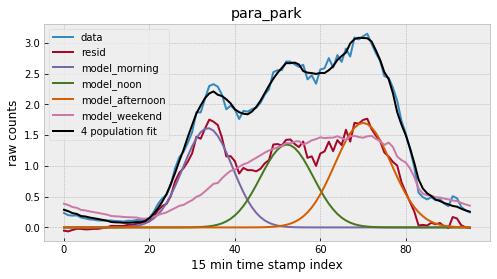

In [21]:

m1, m2, m3, sd1, sd2, sd3, scl1, scl2, scl3, wamp, off = para_park[0]["x"]

model1 = gauss(xval_final, m1, sd1, scl1)
model2 = gauss(xval_final, m2, sd2, scl2)
model3 = gauss(xval_final, m3, sd3, scl3)
pdat = avg_park.iloc[0].values
resid = pdat - wamp * wendvals - off

off = off
plt.style.use("bmh")
fig, ax = plt.subplots(figsize=[8, 4])
ax.plot(xval_final, avg_park.iloc[0], label="data")

ax.plot(resid, label="resid")
ax.plot(model1, label="model_morning")
ax.plot(model2, label="model_noon")
ax.plot(model3, label="model_afternoon")
ax.plot(wamp * wendvals, label="model_weekend")
ax.plot(model1 + model2 + model3 + wamp * wendvals + off, "k", label="4 population fit")

plt.xlabel("15 min time stamp index")
plt.ylabel("raw counts")
ax.set_title("para_park")
plt.legend()
plt.show()

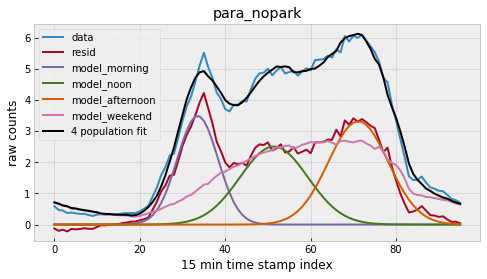

In [22]:
m1, m2, m3, sd1, sd2, sd3, scl1, scl2, scl3, wamp, off = para_nopark[0]["x"]

model1 = gauss(xval_final, m1, sd1, scl1)
model2 = gauss(xval_final, m2, sd2, scl2)
model3 = gauss(xval_final, m3, sd3, scl3)
pdat = avg_nopark.iloc[0].values
resid = pdat - wamp * wendvals - off

off = off
plt.style.use("bmh")
fig, ax = plt.subplots(figsize=[8, 4])
ax.plot(xval_final, avg_nopark.iloc[0], label="data")

ax.plot(resid, label="resid")
ax.plot(model1, label="model_morning")
ax.plot(model2, label="model_noon")
ax.plot(model3, label="model_afternoon")
ax.plot(wamp * wendvals, label="model_weekend")
ax.plot(model1 + model2 + model3 + wamp * wendvals + off, "k", label="4 population fit")

plt.xlabel("15 min time stamp index")
plt.ylabel("raw counts")
ax.set_title("para_nopark")
plt.legend()
plt.show()

# Calculating number of restaurants and benchs with 500 feet

In [0]:
# -- read the data
food_name = os.path.join("drive", "My Drive", "lwir", "data", "food_truck", "DOHMH_New_York_City_Restaurant_Inspection_Results.csv")
restaurant = pd.read_csv(food_name, parse_dates=["INSPECTION DATE"])
#restaurant.head() 

In [0]:
# subset data to available time period
ind = (restaurant["INSPECTION DATE"] >= "2017-01-01") & \
  (restaurant["INSPECTION DATE"] < "2018-01-01") & \
  (restaurant["Latitude"] > 0.0) & \
  (restaurant["Longitude"] < 0.0) & \
  (restaurant["BORO"] == "Manhattan")
restaurant_sub = restaurant[ind]

In [28]:
# camera lat/lon transfer to NYS
import pyproj

def latlon_to_ny(lat, lon):
    """ lat/lon to NYS """

    proj = pyproj.Proj("epsg:2263", preserve_units=True)
    result = proj(lon, lat)

    return result


"""  define helper function """
def npoints(x0, y0, lat, lon):
  
  """ convert lat/lon to NY State Plane """
  ll_nyspd = pyproj.Proj("epsg:2263", preserve_units=True)(lon, lat)

  results = (((ll_nyspd[1] - x0)**2 + (ll_nyspd[0] - y0)**2) <= 250000).sum()

  return results

# calculating number of restaurant within 500 feet
camdat_lat = camera["lat"].to_list()
camdat_lon = camera["lon"].to_list()
lon_mn, lat_mn = latlon_to_ny(camdat_lat, camdat_lon)
camdat_latlon = np.vstack((lat_mn, lon_mn)).T

lat_restaurant = restaurant_sub["Latitude"].to_list()
lon_restaurant = restaurant_sub["Longitude"].to_list()

restaurant_number = []

for i in range(len(camera)): 
  size_point = npoints(camdat_latlon[i, 0], camdat_latlon[i, 1], lat_restaurant, lon_restaurant)
  restaurant_number.append(size_point)

len(restaurant_number)


157

In [0]:
# calculating number of benches within 500 feet
# read and subset the data
benches = gp.read_file("drive/My Drive/lwir/data/nyc_citybench/NYC_CityBench.shp")
benches["Installati"] = pd.to_datetime(benches["Installati"])
ind_thi = benches["Installati"] <= "2017-09-11"
benches_number = benches[ind_thi]

benches_number['lon'] = benches_number['geometry'].x
benches_number['lat'] = benches_number['geometry'].y

In [0]:
"""  define helper function """ 
def npoints_bench(x0, y0, lat, lon):
  
  results = (((lat - x0)**2 + (lon - y0)**2) <= 250000).sum()

  return results
